## Visium

In [74]:
import os
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad

import matplotlib.pyplot as plt
import seaborn as sns

In [75]:
import pysodb

In [76]:
sc.set_figure_params(vector_friendly=False,format='pdf',transparent=True,dpi=50)
plt.rcParams["figure.figsize"] = (8, 8)

sns.set_style('white')

#### load data using pysodb

In [77]:
sodb = pysodb.SODB() # Initialization

/home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/urllib3-1.26.12-py3.9.egg/urllib3/connectionpool.py:1045: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gene.ai.tencent.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


In [ ]:
# this dataset is from publication "Spatially resolved transcriptomics reveals the architecture of the tumor-microenvironment interface"

In [ ]:
# link in SODB: https://gene.ai.tencent.com/SpatialOmics/dataset?datasetID=8

In [80]:
adata = sodb.load_experiment('hunter2021spatially','sample_B')
# the first parameter is the name of the dataset
# the second parameter is the name of one experiment in the dataset

load experiment[sample_B] in dataset[hunter2021spatially] from /home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/pysodb-1.0.0-py3.9.egg/pysodb/cache/hunter2021spatially/sample_B.h5ad


#### identify clusters

In [81]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

In [82]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

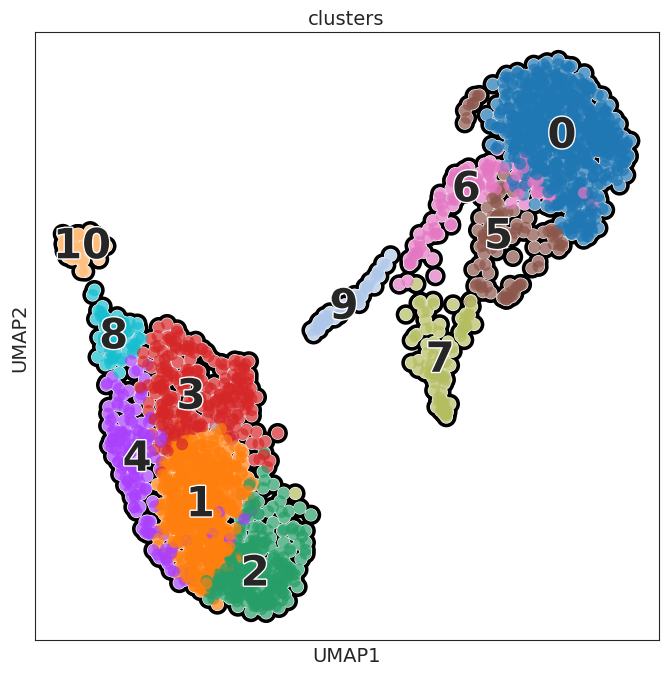

In [90]:
sc.pl.umap(adata, color=[ "clusters"], wspace=0.4,
          add_outline=True,legend_fontsize=30, legend_fontoutline=2,
            legend_loc='on data',
            s=300
          )

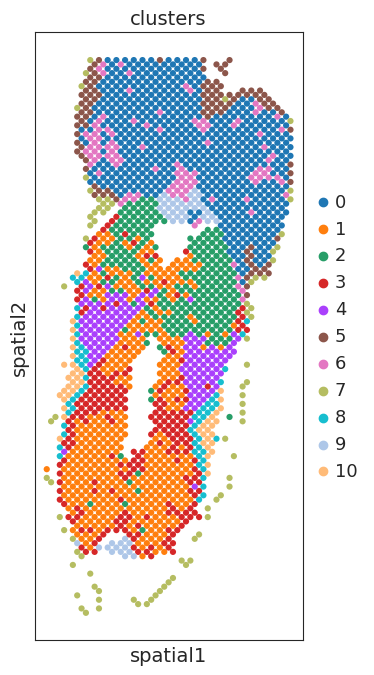

In [93]:
# plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.embedding(adata, basis='spatial', color=['clusters'],show=False,size=80,add_outline=False)
plt.gca().set_aspect('equal', adjustable='box')

#### marker gene detection

/home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/scanpy-1.9.1-py3.9.egg/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


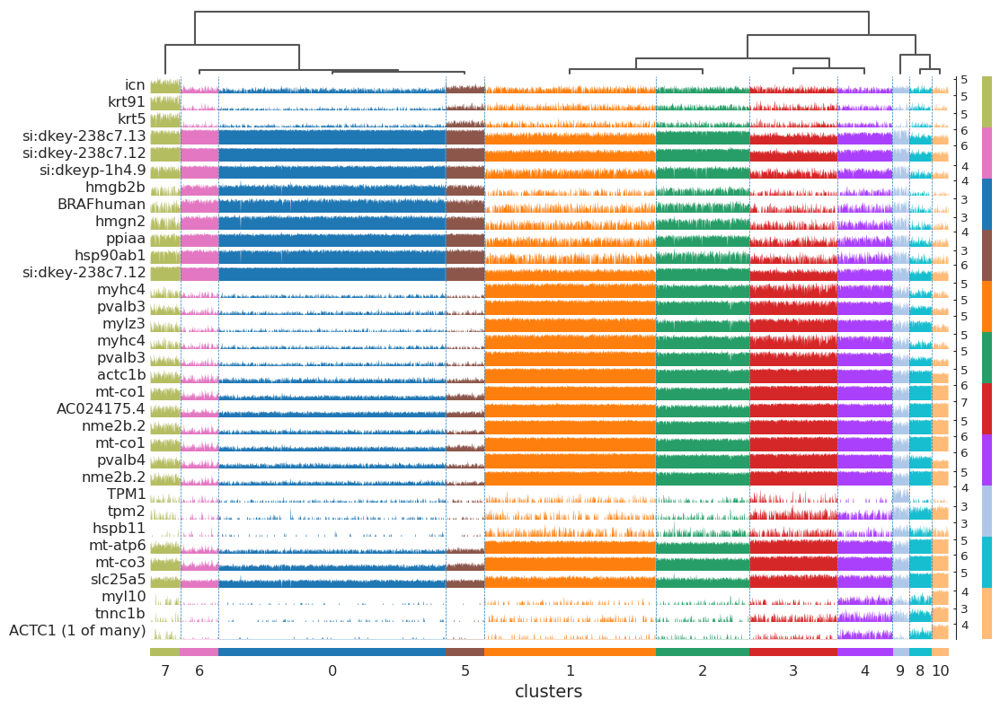

In [85]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_tracksplot(adata, n_genes=3, groupby="clusters")

In [86]:
adata

AnnData object with n_obs × n_vars = 2179 × 32268
    obs: 'col_0', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial_neighbors', 'umap', 'clusters_colors', 'rank_genes_groups', 'dendrogram_clusters'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_pixel', 'spatial_real'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [87]:
marker_genes = adata.uns['rank_genes_groups']['names'][0]

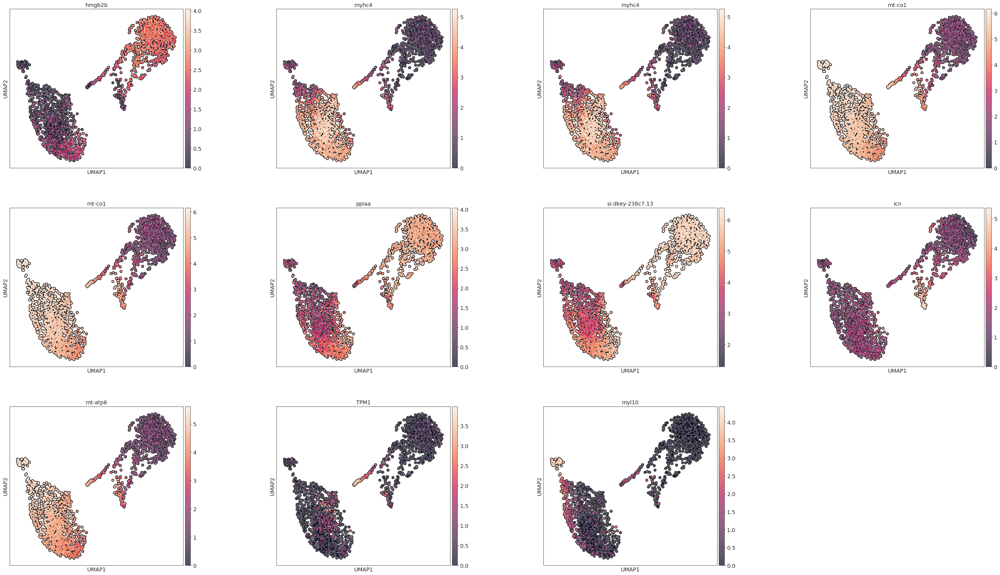

In [88]:
sc.pl.umap(adata, color=marker_genes, wspace=0.4,
          add_outline=True,legend_fontsize=10, legend_fontoutline=2,
            legend_loc='on data',
            s=80
          )

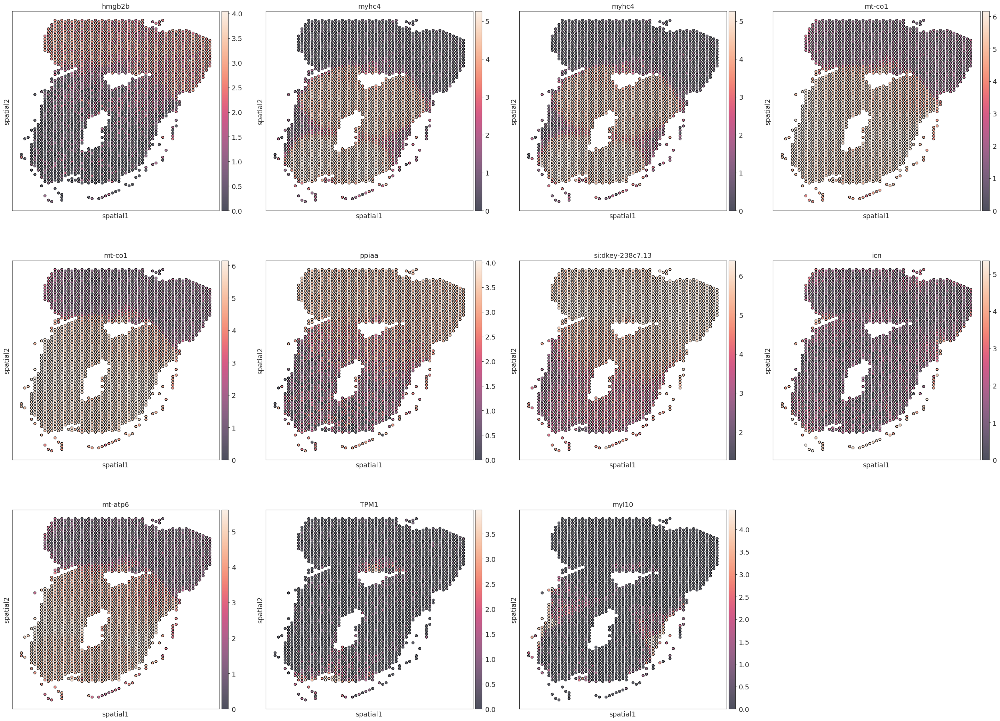

In [94]:
# plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.embedding(adata, basis='spatial', color=marker_genes,size=50,add_outline=True)
